# Detection And Classification of Traffic Signs

The JSON file with the output of the YOLOV4 model was read and the traffic signs were cropped on the images according to the predictions there.(This part developed on Colab)
<br>
<a href="https://github.com/tyasemin/FO-Internship-Project-2/blob/main/traffic_sign_detection/Prediction-FO.ipynb">See Notebook</a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import json
import cv2
from matplotlib import pyplot as plt

In [ ]:
#Reads coordinates and confidence value from JSON file
def return_coordinates(json_obj):
    obj=json_obj['objects']
    coordinate_list=[]
    for bbx in obj:
        coordinates=bbx['relative_coordinates']
        center_x,center_y,width,height=coordinates['center_x'],coordinates['center_y'],coordinates['width'],coordinates['height']
        confidence=bbx['confidence']
        coordinate_list.append((center_x,center_y,width,height,confidence))
    return coordinate_list


In [ ]:
#returns image path
def return_image_path(json_obj):
    path=json_obj['filename']
    return path

In [ ]:
#returns image size
def return_image_size(img):
  return img.shape[1],img.shape[0]

In [ ]:
#returns image name
def return_image_name(path):
  image_name=path[40:]
  return image_name

In [ ]:
#returns json file name
def return_json_name(img_name):
  JSON_DIR="/content/drive/MyDrive/model/ann/"
  return JSON_DIR+img_name[:-3]+"png"+".json"

Before images are sent to the model, they are converted to a NumPy array and normalized.

In [ ]:
def prepare_cropped_image(image):
      image = Image.fromarray(image, 'RGB')
      image = image.resize((32, 32))
      np_image=np.array(image)
      np_image=np_image/255
      return np.expand_dims(np_image,axis=0)

In [ ]:
#Draws ground truth values of traffic signs on images
#reads coordinates from ground truth jsons
def return_GT_image(json_obj,img):
  with open(json_obj,'r') as f:

    jsnfile=json.load(f)
    GT_obj=jsnfile['objects']
    for obj in GT_obj:
      if obj['classTitle']=="Traffic Sign":
        obj_class_pts = obj['points']['exterior']
        x_0=obj_class_pts[0][0]
        y_0=obj_class_pts[0][1]
        x_1=obj_class_pts[1][0]
        y_1=obj_class_pts[1][1]

        cv2.rectangle(img, (int(x_0), int(y_0)), (int(x_1),int(y_1)),
                              color=(0, 0, 255), 
                              thickness=2)
        plt.imshow(img)
    return img

In [ ]:
json_path='/content/drive/MyDrive/model/FOModelPrediction.json' 

In [ ]:
#draws ground truth bboxs 
from keras import models
from PIL import Image
import numpy as np
import cv2
from matplotlib import pyplot as plt
with open(json_path, 'r') as f:
    jsonfile = json.load(f)
    json_obj=jsonfile
ground_path="/content/drive/MyDrive/GT/"
final_path="/content/drive/MyDrive/FO_best/"

i=0
for obj in json_obj:

  img_path=return_image_path(obj)
  coordinates=return_coordinates(obj)
  img=cv2.imread(img_path)
  #ground
  img_name=return_image_name(img_path)
  GT_json=return_json_name(img_name)
  GT_img=return_GT_image(GT_json,img) 
  #ground

  img_1,img_0=return_image_size(img)

In [ ]:
#Loads the classification model
classification_model=models.load_model("/content/drive/MyDrive/model/classification_model.h5")

In [ ]:
#Crops YOLOV4 model's output(bounding box) from image
  for bbx in coordinates: 
    test_img=[]
    xcenter,ycenter,width,height,confidence=bbx

    xcenter=xcenter*img_1
    ycenter=ycenter*img_0

    width=width*img_1
    height=height*img_0

    x_min=abs(xcenter-(width/2))
    y_min=abs(ycenter-(height/2))

    x_max=width+x_min
    y_max=height+y_min

    w=int(width)
    h=int(height)

    crop_img = img[int(y_min):int(y_min)+h,int(x_min):int(x_min)+w]

In [ ]:
#Prepares image for classification model
test_img=prepare_cropped_image(crop_img)

After preparing the image, it is sent to the model, the output is taken and the id of the class is written on the image.

In [ ]:
    prediction=classification_model.predict(test_img)

    prediction=np.argmax(prediction,axis=1)
    print(prediction)
    cv2.rectangle(img, (int(x_min+w), int(y_min+h)), (int(x_min),int(y_min)),
                              color=(0, 255, 0), 
                              thickness=2)
    sign_label="id"+str(prediction)
    cv2.putText(img,sign_label, (int(x_min), int(y_min)-10), cv2.FONT_HERSHEY_SIMPLEX, 1, (36,255,12), 2)
    
    i+=1
  
  cv2.imwrite(final_path+str(i)+".jpg",img)

The model works quite consistently in the GTS dataset. However, there are traffic signs specific to Turkey in the dataset that this model will classify.
<br>
Since the model does not learn these traffic signs, it will misclassify.
<br>
Therefore, traffic signs specific to Turkey should also be added to the classification model's dataset.Example of traffic signs that the model classifies correctly are as follows.

THis one is correctly classified by the classification model.

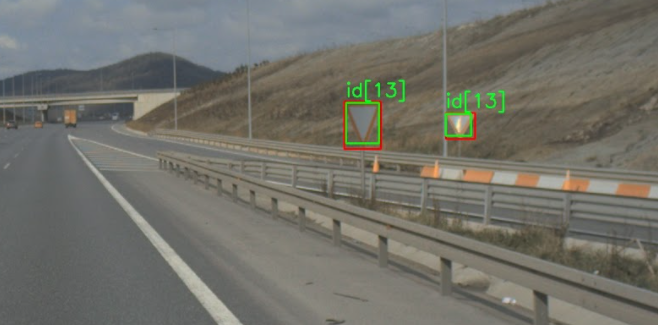

Below is an example of images that are not included in the classification dataset and misclassified by the classification model.

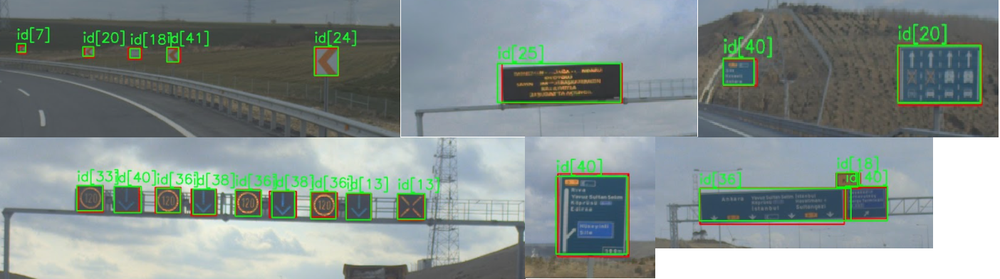

## Improving The Classification Dataset With Turkish Traffic Signs

Traffic signs in the train and validation datasets used for the traffic sign detection model were cropped according to the coordinates of the annotations annotated by humans and included in the classification model.The separation of these cropped signs was also done manually.

Traffic sign cropping was achieved with the following code
<br>
<a href="https://github.com/tyasemin/FO-Internship-Project-2/blob/main/traffic_sign_classification/crop_train.py">See source code</a>

In [ ]:
from matplotlib import pyplot as plt

import os
import json
import cv2

ROOT_DIR= "C:/.../internvL/ann/"
json_names=os.listdir(ROOT_DIR)
print(json_names)

def return_image_name(json_name):
  return json_name[:-8]+"jpg"

i=0
for jsn in json_names:
  JSON_PATH=os.path.join(ROOT_DIR,jsn)
  IMG_PATH="C:/.../internvL/img"

  with open(JSON_PATH,'r') as f:
    jsnfile=json.load(f)
    json_obj=jsnfile['objects']
    for obj in json_obj:
      if obj['classTitle']=="Traffic Sign":
        img_name=return_image_name(jsn)
        img_path=os.path.join(IMG_PATH,img_name)

        print(img_path)
    
        obj_class_pts = obj['points']['exterior']
        x_0=obj_class_pts[0][0]
        y_0=obj_class_pts[0][1]
        x_1=obj_class_pts[1][0]
        y_1=obj_class_pts[1][1]

        img = cv2.imread(img_path)

        w = x_1 - x_0
        h = y_1 - y_0

       
        try:
            crop_img = img[y_0:y_0+h, x_0:x_0+w]
            plt.imshow(crop_img)
            out_path=os.path.join("C:/.../internvL/cropped",str(i)+".png")
            cv2.imwrite(out_path,crop_img)
            i+=1
        except ValueError:
            pass

The ids of the new classes created for these images are below.

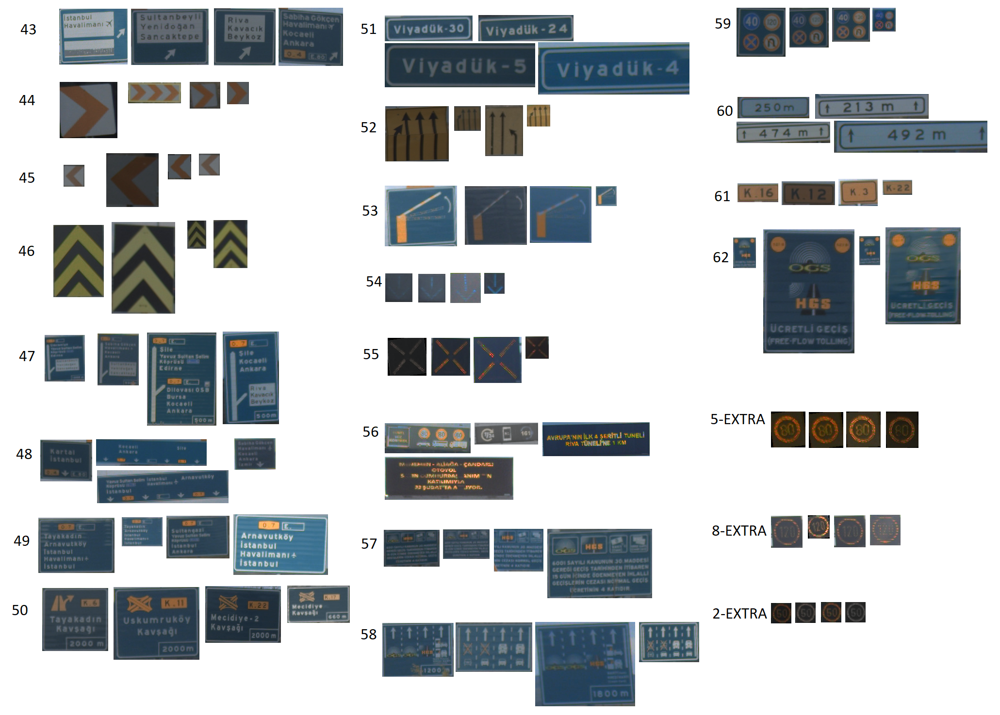

Since the training code will call the augmentation code within itself, even if the number of examples above is small (about more than 100 for each class), this number will be increased by applying augmentation.

Examples after augmentation are given below. Left ones before augmentation and right ones after augmentation.

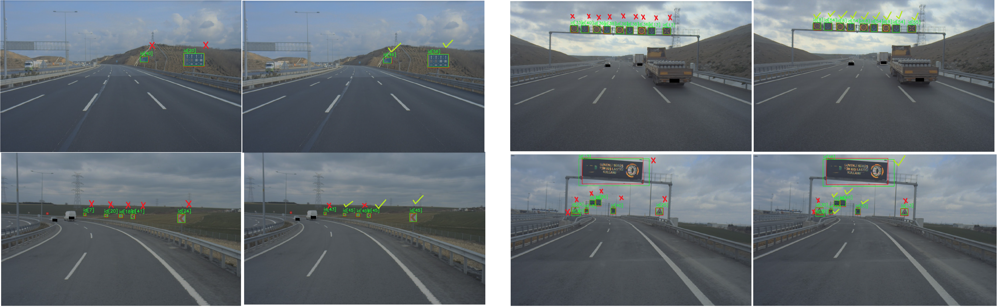

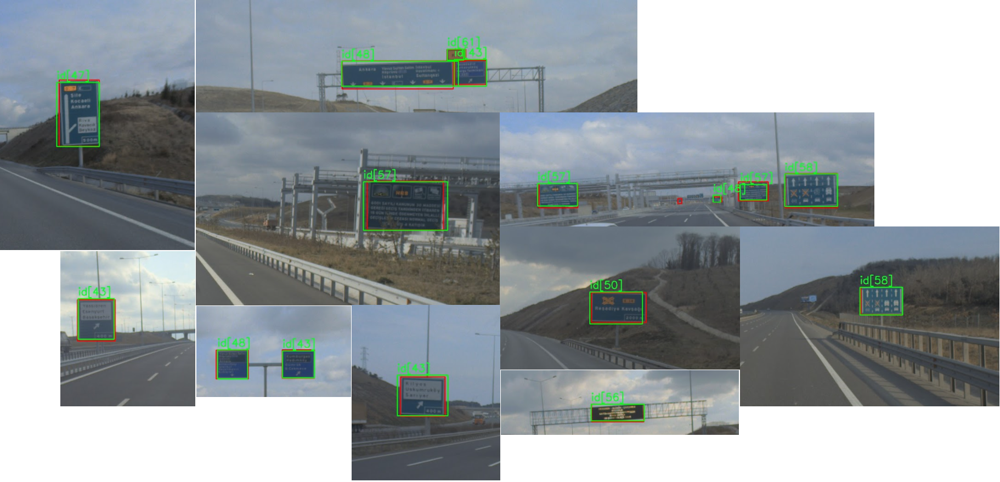